In [1]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import pandas as pd

from scipy import stats

from dependencies import (
    perform_kmeans_clustering, 
    get_annual_return, 
    perform_polynomial_on_clustering, 
    combine_polynomial_plots,
    POLYNOMIAL_DEGREE
)

In [2]:
data_frame = pd.read_csv('datasets/S&P500_EOD-Price.csv')
data_frame = data_frame.dropna(axis=1)

data_frame.head()

,Date,APA,MTCH,GEN,DXC,EG,BKR,AMD,HON,BALL,...,SNPS,SWKS,ZION,TTWO,VRTX,TRMB,ZBRA,LNT,BBWI,WBA
0,2000-01-03,14.772727,7.527071,7.109375,46.327873,21.8750,20.2500,15.500,54.044136,2.488281,...,32.781250,31.406250,55.5000,9.125000,18.78125,4.145833,25.027779,13.40625,16.395514,28.5625
1,2000-01-04,14.123377,6.921444,6.781250,46.017365,21.8125,20.2500,14.625,53.090767,2.406250,...,30.437500,29.562500,52.8125,8.875000,17.28125,4.072917,24.666668,13.40625,16.067099,27.5000
2,2000-01-05,14.529221,6.661890,6.375000,42.788074,23.2500,20.3750,15.000,52.375736,2.449219,...,30.703125,30.328125,52.7500,8.833333,17.00000,3.817708,25.138889,14.06250,15.839733,27.8125
3,2000-01-06,15.909091,6.938748,6.007813,43.409092,24.3125,22.3125,16.000,53.388695,2.488281,...,28.468750,27.375000,53.5000,8.750000,16.75000,3.854167,23.777779,14.06250,15.587106,27.0000
4,2000-01-07,15.854978,6.904141,6.484375,43.315941,25.6250,23.8125,16.250,56.248802,2.417969,...,28.750000,30.187500,53.6250,9.000000,18.21875,3.854167,23.513889,14.25000,15.688157,27.6875


In [3]:
data_frame["Date"] = pd.to_datetime(data_frame["Date"])
data_frame['Year'] = data_frame["Date"].dt.year
data_frame["Quarter"] = data_frame["Date"].dt.quarter

start_year = 2000
end_year = 2022
quarters = [1, 2, 3, 4]

data_frame_rolling_returns = []

for year in range(start_year, end_year): 
    for quarter in quarters:
        filtered_data_frame_1 = data_frame[((data_frame['Year'] == year) & (data_frame['Quarter'] >= quarter))]
        filtered_data_frame_2 = data_frame[(data_frame['Year'] == year + 1)]
        filtered_data_frame_3 = data_frame[((data_frame['Year'] == year + 2) & (data_frame['Quarter'] < quarter))]
        
        filtered_data = pd.concat([filtered_data_frame_1, filtered_data_frame_2, filtered_data_frame_3])
        filtered_data = filtered_data.reset_index(drop=True)
        
        for column in filtered_data.columns:
            if column not in ["Date", "Year", "Quarter"] and not filtered_data.empty:
                rolling_return = get_annual_return(filtered_data[column].iloc[0], filtered_data[column].iloc[-1])
                rolling_returns = [get_annual_return(filtered_data[column].iloc[0], filtered_data[column].iloc[i]) for i in range(len(filtered_data))]  
                relative_percentile = stats.percentileofscore(rolling_returns, rolling_return)
                data_frame_rolling_returns.append({'Stock': column, 'Year': year, 'Quarter': quarter, 'Rolling_Return': rolling_return, 'Relative_Percentile': relative_percentile})

data_frame_rolling_percentile = pd.DataFrame(data_frame_rolling_returns)
data_frame_rolling_percentile.head(100)


,Stock,Year,Quarter,Rolling_Return,Relative_Percentile
0,APA,2000,1,60.785345,49.8
1,MTCH,2000,1,0.450574,96.3
2,GEN,2000,1,16.624176,84.8
3,DXC,2000,1,-47.474530,38.4
4,EG,2000,1,223.199986,90.0
...,...,...,...,...,...
95,WEC,2000,1,18.347541,81.0
96,ECL,2000,1,6.799337,71.4
97,LEG,2000,1,11.854103,91.3
98,NEE,2000,1,36.727273,55.6


In [4]:
data_frame_rolling_percentile.tail(100)

,Stock,Year,Quarter,Rolling_Return,Relative_Percentile
32020,SCHW,2021,4,-26.229504,12.749004
32021,T,2021,4,-26.780268,10.258964
32022,UHS,2021,4,-9.436000,33.665339
32023,WAB,2021,4,19.943566,87.450199
32024,WRB,2021,4,27.969632,51.593625
...,...,...,...,...,...
32115,TRMB,2021,4,-35.987638,32.669323
32116,ZBRA,2021,4,-53.710518,2.589641
32117,LNT,2021,4,-13.140907,0.597610
32118,BBWI,2021,4,-47.187502,13.147410


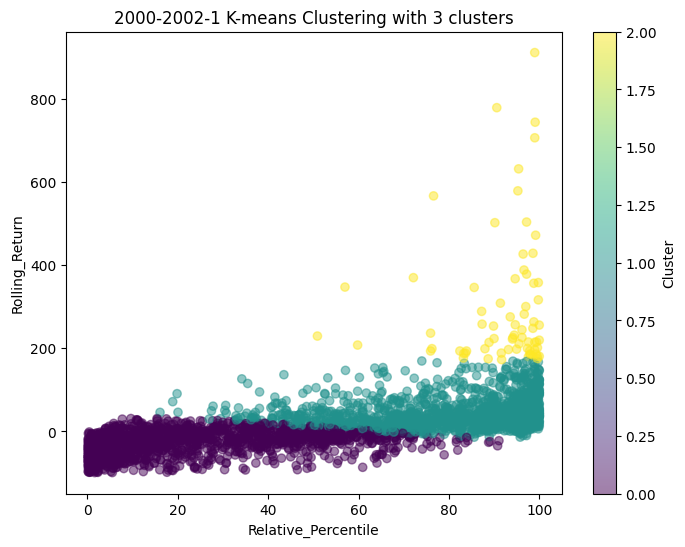

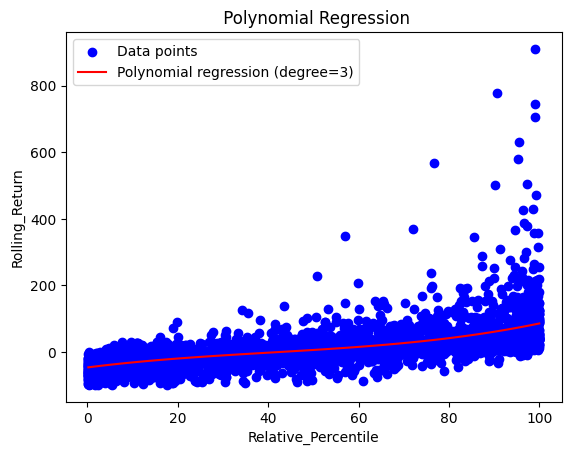

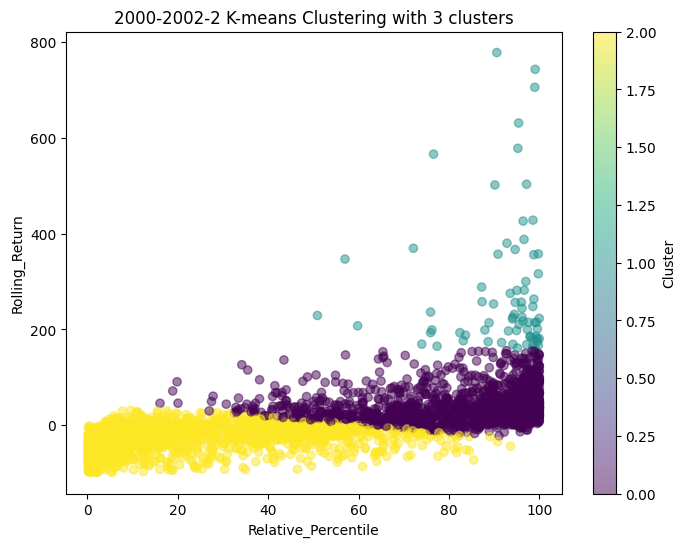

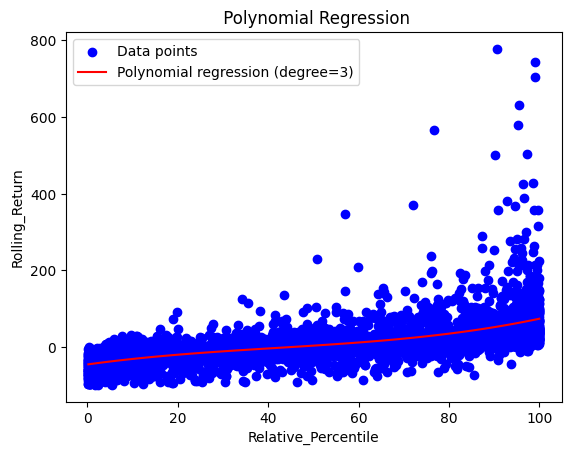

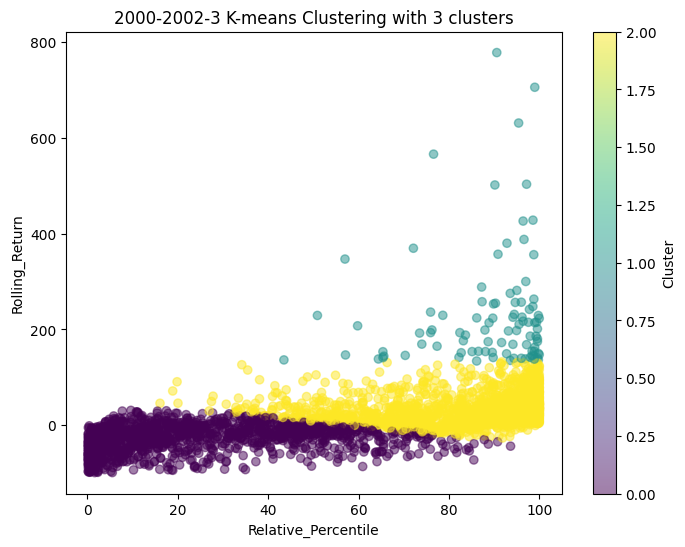

...

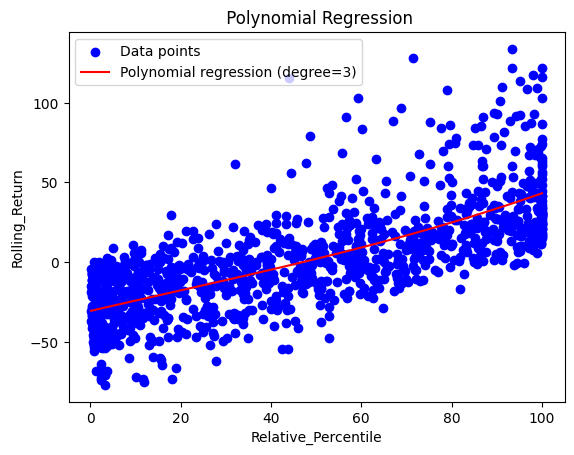

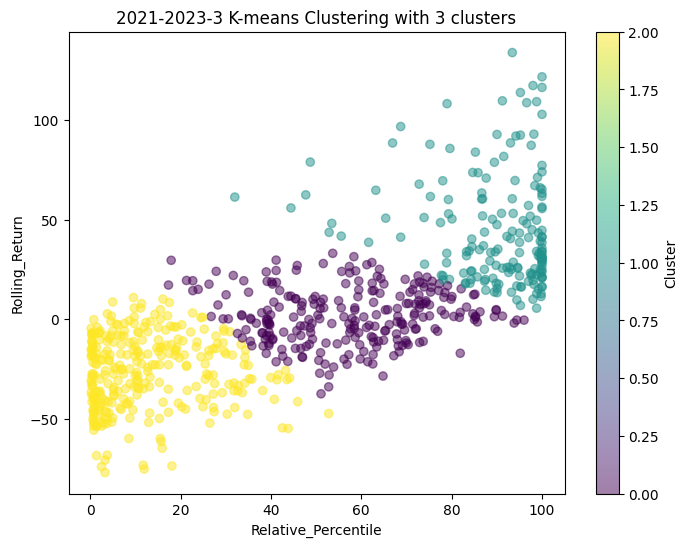

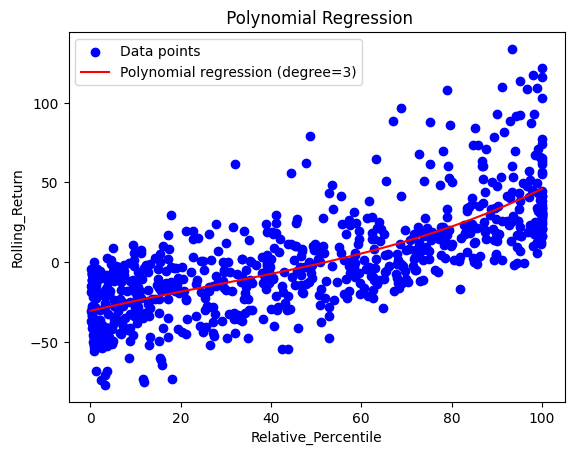

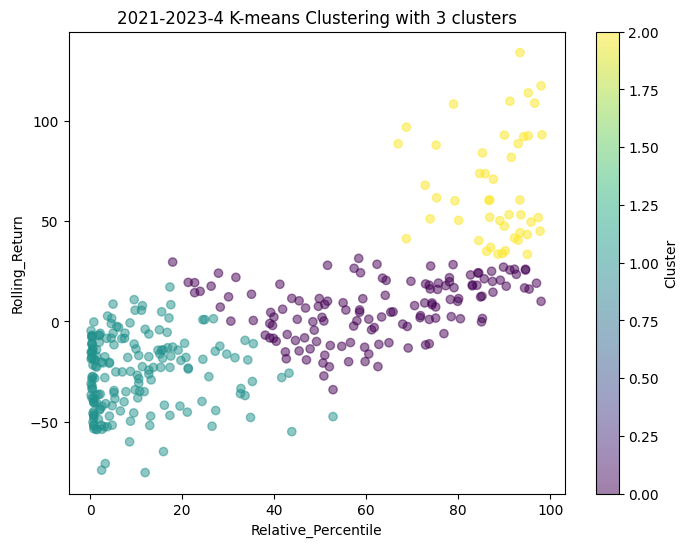

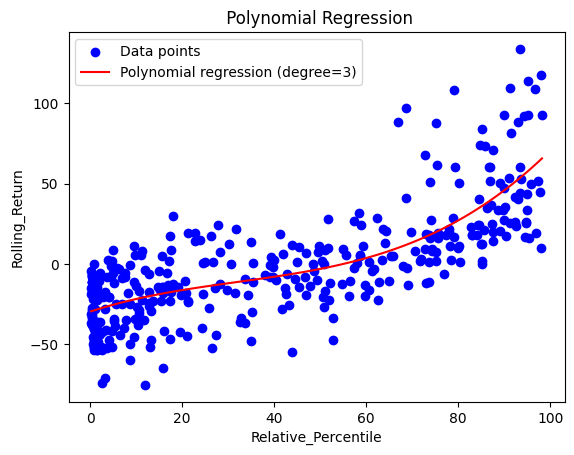

In [5]:
import numpy as np

cmap = plt.cm.viridis
norm = mcolors.Normalize(vmin=0, vmax=2)
num_colors = 25
random_colors = np.random.rand(num_colors, 3)
index = 1
all_xs_pred = None
all_y_pred = None

for year in range(start_year, end_year): 
    for quarter in quarters:
        filtered_data_frame_1 = data_frame_rolling_percentile[((data_frame_rolling_percentile['Year'] == year) & (data_frame_rolling_percentile['Quarter'] >= quarter))]
        filtered_data_frame_2 = data_frame_rolling_percentile[(data_frame_rolling_percentile['Year'] == year + 1)]
        filtered_data_frame_3 = data_frame_rolling_percentile[((data_frame_rolling_percentile['Year'] == year + 2) & (data_frame_rolling_percentile['Quarter'] < quarter))]
        
        filtered_data_frame_by_rolling = pd.concat([filtered_data_frame_1, filtered_data_frame_2, filtered_data_frame_3])
        filtered_data_frame_by_rolling = filtered_data_frame_by_rolling.reset_index(drop=True)

        if not filtered_data_frame_by_rolling.empty:
            perform_kmeans_clustering(filtered_data_frame_by_rolling, ['Relative_Percentile', 'Rolling_Return'], cmap, str(year) + '-' + str(year + 2) + '-' + str(quarter) + ' K-means Clustering with 3 clusters', save_as_image=False)
            perform_polynomial_on_clustering(filtered_data_frame_by_rolling, ['Relative_Percentile', 'Rolling_Return'], ' Polynomial Regression', save_as_image=False)
            all_xs_pred, all_y_pred = combine_polynomial_plots(filtered_data_frame_by_rolling, ['Relative_Percentile', 'Rolling_Return'], all_xs_pred, all_y_pred)

In [6]:
num_colors = 500
random_colors = []

while len(random_colors) < num_colors:
    color = np.random.rand(3)
    if not any(np.array_equal(color, existing_color) for existing_color in random_colors):
        random_colors.append(color)

random_colors = np.array(random_colors)

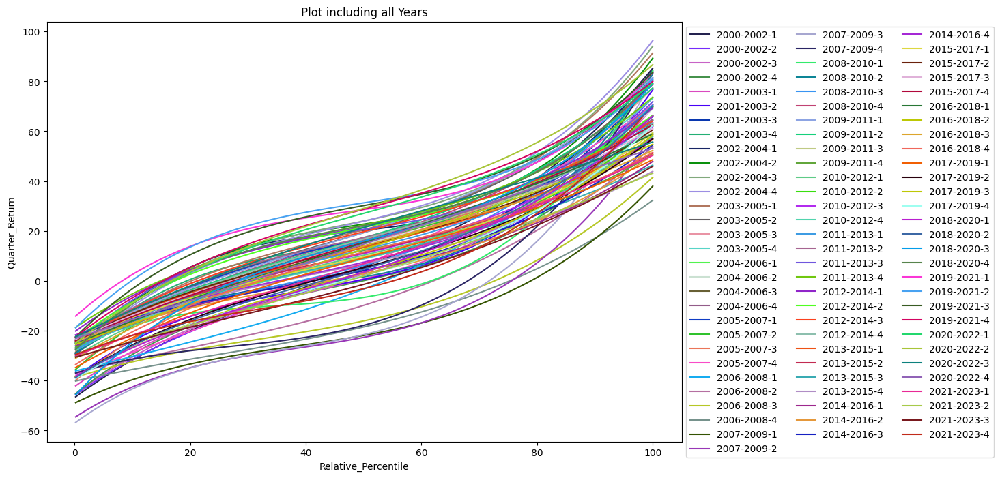

In [7]:
plt.figure(figsize=(12, 8))

index = 0
for year in range(start_year, end_year): 
    for quarter in quarters:
        plt.plot(all_xs_pred[index], all_y_pred[index], color=random_colors[index], label=str(year) + '-' + str(year + 2) + '-' + str(quarter))
        index += 1

plt.xlabel('Relative_Percentile')
plt.ylabel('Quarter_Return')
plt.title('Plot including all Years')

num_cols = 3  
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), ncol=num_cols)

plt.savefig("regressions/all-years-plot")
plt.show()
